In [ ]:
# !pip install -q pytorch-lightning==2.4.0
# !pip install -q transformers==4.46.2 datasets==2.21.0 roboflow==1.1.49

In [1]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks.model_checkpoint import ModelCheckpoint
from pytorch_lightning.loggers import CSVLogger
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation
from datasets import load_metric
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import os
from PIL import Image
import numpy as np
import random

c:\Users\shiva\anaconda3\envs\GPU\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="58BX6EZLXZvWhy5sZjLn")
project = rf.workspace("intel-challenge").project("nalla-z6fmr")
version = project.version(3)
dataset = version.download("png-mask-semantic")
                

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to nalla-3 in png-mask-semantic:: 100%|██████████| 2536/2536 [00:01<00:00, 1297.01it/s]


In [3]:
class SemanticSegmentationDataset(Dataset):
    """Image (semantic) segmentation dataset."""

    def __init__(self, root_dir, feature_extractor):
        """
        Args:
            root_dir (string): Root directory of the dataset containing the images + annotations.
            feature_extractor (SegFormerFeatureExtractor): feature extractor to prepare images + segmentation maps.
            train (bool): Whether to load "training" or "validation" images + annotations.
        """
        self.root_dir = root_dir
        self.feature_extractor = feature_extractor

        self.classes_csv_file = os.path.join(self.root_dir, "_classes.csv")
        with open(self.classes_csv_file, 'r') as fid:
            data = [l.split(',') for i,l in enumerate(fid) if i !=0]
        self.id2label = {x[0]:x[1] for x in data}

        image_file_names = [f for f in os.listdir(self.root_dir) if '.jpg' in f]
        mask_file_names = [f for f in os.listdir(self.root_dir) if '.png' in f]

        self.images = sorted(image_file_names)
        self.masks = sorted(mask_file_names)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        image = Image.open(os.path.join(self.root_dir, self.images[idx]))
        segmentation_map = Image.open(os.path.join(self.root_dir, self.masks[idx]))

        # randomly crop + pad both image and segmentation map to same size
        encoded_inputs = self.feature_extractor(image, segmentation_map, return_tensors="pt")

        for k,v in encoded_inputs.items():
          encoded_inputs[k].squeeze_() # remove batch dimension

        return encoded_inputs

In [4]:
class SegformerFinetuner(pl.LightningModule):

    def __init__(self, id2label, train_dataloader=None, val_dataloader=None, test_dataloader=None, metrics_interval=100):
        super(SegformerFinetuner, self).__init__()
        self.id2label = id2label
        self.metrics_interval = metrics_interval
        self.train_dl = train_dataloader
        self.val_dl = val_dataloader
        self.test_dl = test_dataloader

        self.num_classes = len(id2label.keys())
        self.label2id = {v:k for k,v in self.id2label.items()}

        self.model = SegformerForSemanticSegmentation.from_pretrained(
            "nvidia/segformer-b0-finetuned-ade-512-512",
            return_dict=False,
            num_labels=self.num_classes,
            id2label=self.id2label,
            label2id=self.label2id,
            ignore_mismatched_sizes=True,
        )

        self.train_mean_iou = load_metric("mean_iou",trust_remote_code=True)
        self.val_mean_iou = load_metric("mean_iou",trust_remote_code=True)
        self.test_mean_iou = load_metric("mean_iou",trust_remote_code=True)

        self.validation_step_outputs = []

    def forward(self, images, masks):
        outputs = self.model(pixel_values=images, labels=masks)
        return outputs

    def training_step(self, batch, batch_nb):

        images, masks = batch['pixel_values'], batch['labels']

        outputs = self(images, masks)

        loss, logits = outputs[0], outputs[1]

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        predicted = upsampled_logits.argmax(dim=1)

        self.train_mean_iou.add_batch(
            predictions=predicted.detach().cpu().numpy(),
            references=masks.detach().cpu().numpy()
        )
        if batch_nb % self.metrics_interval == 0:

            metrics = self.train_mean_iou.compute(
                num_labels=self.num_classes,
                ignore_index=255,
                reduce_labels=False,
            )

            metrics = {'loss': loss, "mean_iou": metrics["mean_iou"], "mean_accuracy": metrics["mean_accuracy"]}

            for k,v in metrics.items():
                self.log(k,v)

            return(metrics)
        else:
            return({'loss': loss})

    def validation_step(self, batch, batch_nb):

        images, masks = batch['pixel_values'], batch['labels']

        outputs = self(images, masks)

        loss, logits = outputs[0], outputs[1]

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        predicted = upsampled_logits.argmax(dim=1)

        self.val_mean_iou.add_batch(
            predictions=predicted.detach().cpu().numpy(),
            references=masks.detach().cpu().numpy()
        )

        self.validation_step_outputs.append({'val_loss': loss})

        return({'val_loss': loss})

    def on_validation_epoch_end(self):
        metrics = self.val_mean_iou.compute(
              num_labels=self.num_classes,
              ignore_index=255,
              reduce_labels=False,
          )

        avg_val_loss = torch.stack([x["val_loss"] for x in self.validation_step_outputs]).mean()
        val_mean_iou = metrics["mean_iou"]
        val_mean_accuracy = metrics["mean_accuracy"]

        metrics = {"val_loss": avg_val_loss, "val_mean_iou":val_mean_iou, "val_mean_accuracy":val_mean_accuracy}
        for k,v in metrics.items():
            self.log(k,v)

        self.validation_step_outputs.clear()

        return metrics

    def test_step(self, batch, batch_nb):

        images, masks = batch['pixel_values'], batch['labels']

        outputs = self(images, masks)

        loss, logits = outputs[0], outputs[1]

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        predicted = upsampled_logits.argmax(dim=1)

        self.test_mean_iou.add_batch(
            predictions=predicted.detach().cpu().numpy(),
            references=masks.detach().cpu().numpy()
        )

        return({'test_loss': loss})

    def test_epoch_end(self, outputs):
        metrics = self.test_mean_iou.compute(
              num_labels=self.num_classes,
              ignore_index=255,
              reduce_labels=False,
          )

        avg_test_loss = torch.stack([x["test_loss"] for x in outputs]).mean()
        test_mean_iou = metrics["mean_iou"]
        test_mean_accuracy = metrics["mean_accuracy"]

        metrics = {"test_loss": avg_test_loss, "test_mean_iou":test_mean_iou, "test_mean_accuracy":test_mean_accuracy}

        for k,v in metrics.items():
            self.log(k,v)

        return metrics

    def configure_optimizers(self):
        return torch.optim.Adam([p for p in self.parameters() if p.requires_grad], lr=2e-05, eps=1e-08)

    def train_dataloader(self):
        return self.train_dl

    def val_dataloader(self):
        return self.val_dl

    def test_dataloader(self):
        return self.test_dl




In [5]:
feature_extractor = SegformerFeatureExtractor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")
feature_extractor.do_reduce_labels = False
feature_extractor.size = 128

train_dataset = SemanticSegmentationDataset(f"{dataset.location}/train/", feature_extractor)
val_dataset = SemanticSegmentationDataset(f"{dataset.location}/valid/", feature_extractor)
test_dataset = SemanticSegmentationDataset(f"{dataset.location}/test/", feature_extractor)

batch_size = 8
num_workers = 0
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, num_workers=num_workers)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, num_workers=num_workers)

segformer_finetuner = SegformerFinetuner(
    train_dataset.id2label,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    metrics_interval=10,
)

The class SegformerFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use SegformerImageProcessor instead.
The following named arguments are not valid for `SegformerFeatureExtractor.__init__` and were ignored: 'feature_extractor_type'
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([3]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([3, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evalu

In [ ]:
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    min_delta=0.00,
    patience=10,
    verbose=False,
    mode="min",
)

checkpoint_callback = ModelCheckpoint(save_top_k=1, monitor="val_loss")

trainer = pl.Trainer(
    callbacks=[early_stop_callback, checkpoint_callback],
    max_epochs=500,
    val_check_interval=len(train_dataloader),
)
trainer.fit(segformer_finetuner)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                             | Params | Mode
------------------------------------------------------------------
0 | model | SegformerForSemanticSegmentation | 3.7 M  | eval
------------------------------------------------------------------
3.7 M     Trainable params
0         Non-trainable params
3.7 M     Total params
14.860    Total estimated model params size (MB)
0         Modules in train mode
213       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


invalid value encountered in divide
The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 0: 100%|██████████| 144/144 [01:44<00:00,  1.38it/s, v_num=0]

invalid value encountered in divide


Epoch 15:   7%|▋         | 10/144 [00:04<01:05,  2.04it/s, v_num=0] 

In [15]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

In [18]:
# res = trainer.test(ckpt_path="")

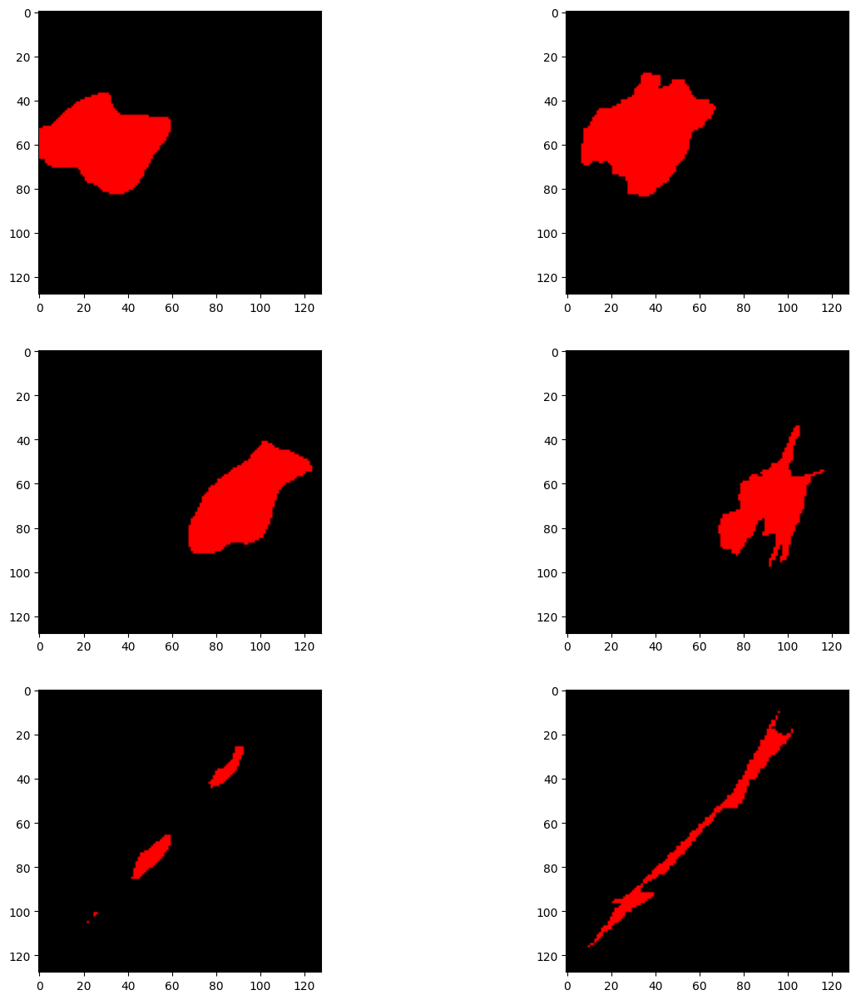

In [20]:
import matplotlib.pyplot as plt
color_map = {
    0:(0,0,0),
    1:(255,0,0),
}

def prediction_to_vis(prediction):
    vis_shape = prediction.shape + (3,)
    vis = np.zeros(vis_shape)
    for i,c in color_map.items():
        vis[prediction == i] = color_map[i]
    return Image.fromarray(vis.astype(np.uint8))

for batch in test_dataloader:
    images, masks = batch['pixel_values'], batch['labels']
    outputs = segformer_finetuner.model(images, masks)

    loss, logits = outputs[0], outputs[1]

    upsampled_logits = nn.functional.interpolate(
        logits,
        size=masks.shape[-2:],
        mode="bilinear",
        align_corners=False
    )
    predicted_mask = upsampled_logits.argmax(dim=1).cpu().numpy()
    masks = masks.cpu().numpy()

n_plots = min(4, predicted_mask.shape[0])  # Ensure we don't exceed available samples
f, axarr = plt.subplots(n_plots, 2)
f.set_figheight(15)
f.set_figwidth(15)

for i in range(n_plots):
    axarr[i, 0].imshow(prediction_to_vis(predicted_mask[i, :, :]))
    axarr[i, 1].imshow(prediction_to_vis(masks[i, :, :]))

plt.show()



In [21]:
#Predict on a test image and overlay the mask on the original image
test_idx = 0
input_image_file = os.path.join(test_dataset.root_dir,test_dataset.images[test_idx])
input_image = Image.open(input_image_file)
test_batch = test_dataset[test_idx]
images, masks = test_batch['pixel_values'], test_batch['labels']
images = torch.unsqueeze(images, 0)
masks = torch.unsqueeze(masks, 0)
outputs = segformer_finetuner.model(images, masks)

loss, logits = outputs[0], outputs[1]

upsampled_logits = nn.functional.interpolate(
    logits,
    size=masks.shape[-2:],
    mode="bilinear",
    align_corners=False
)
predicted_mask = upsampled_logits.argmax(dim=1).cpu().numpy()
mask = prediction_to_vis(np.squeeze(masks))
mask = mask.resize(input_image.size)
mask = mask.convert("RGBA")
input_image = input_image.convert("RGBA")
overlay_img = Image.blend(input_image, mask, 0.5)

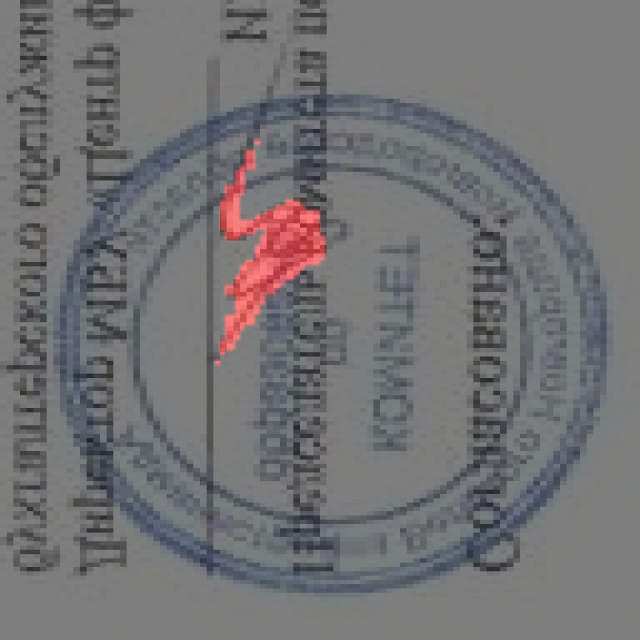

In [22]:
overlay_img

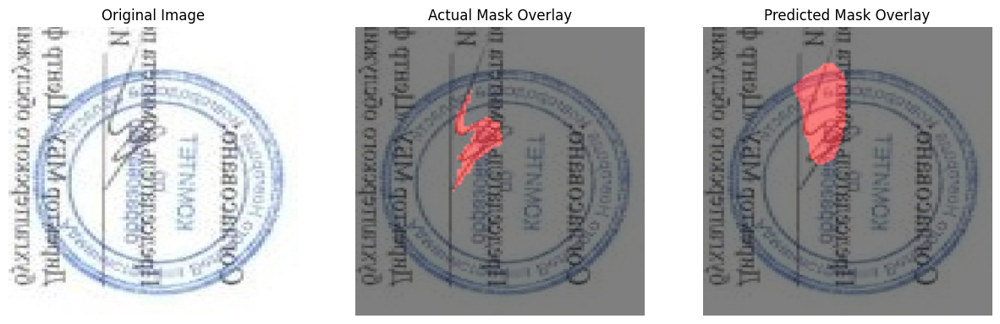

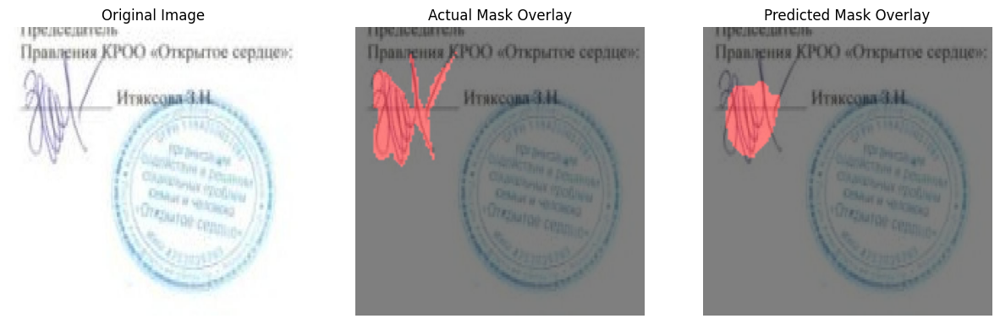

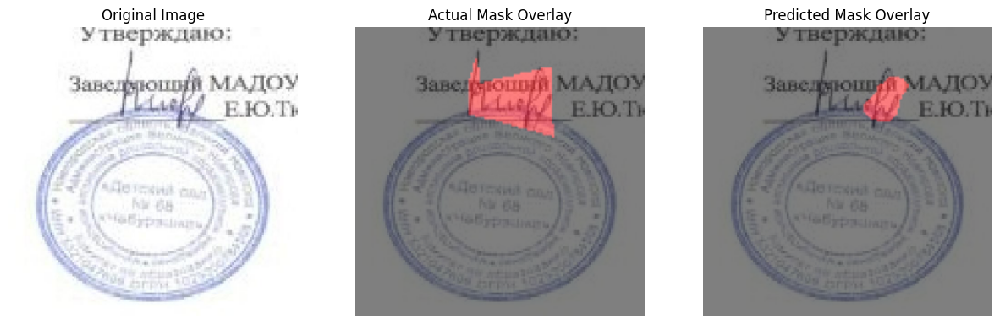

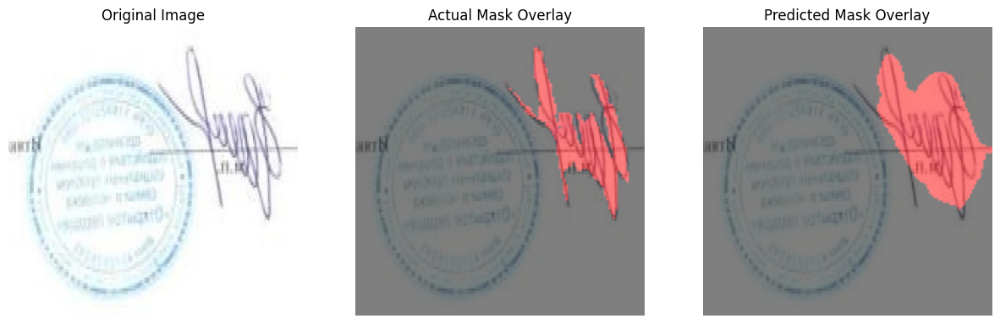

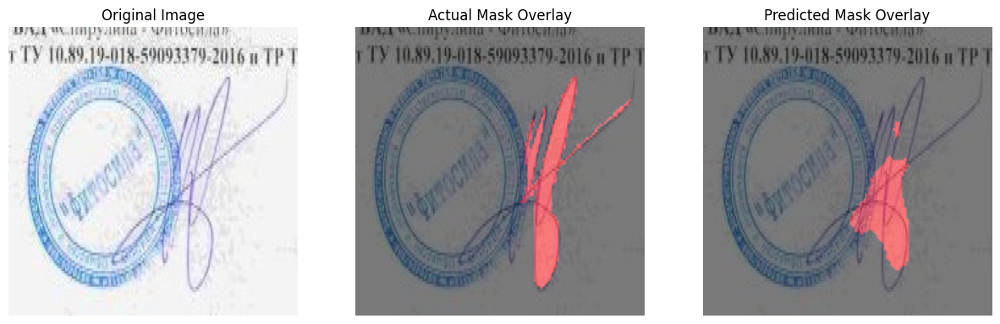

...

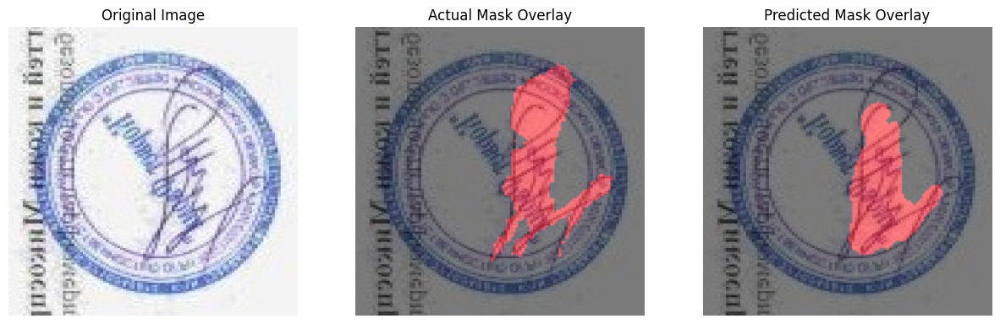

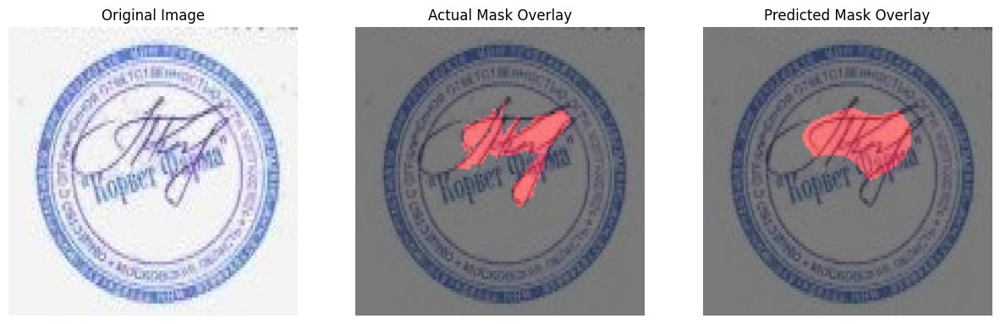

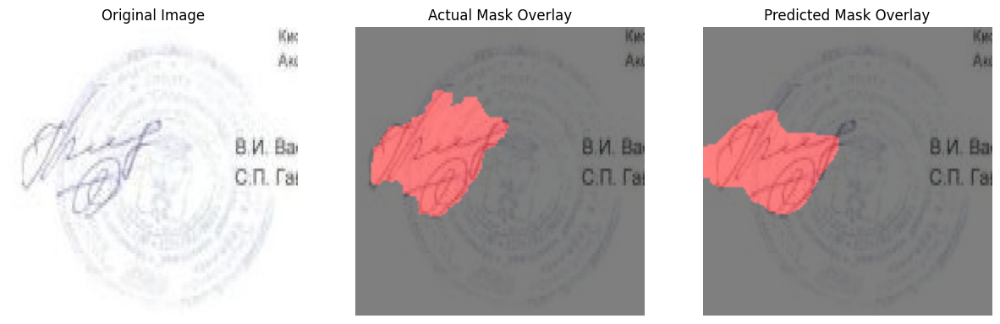

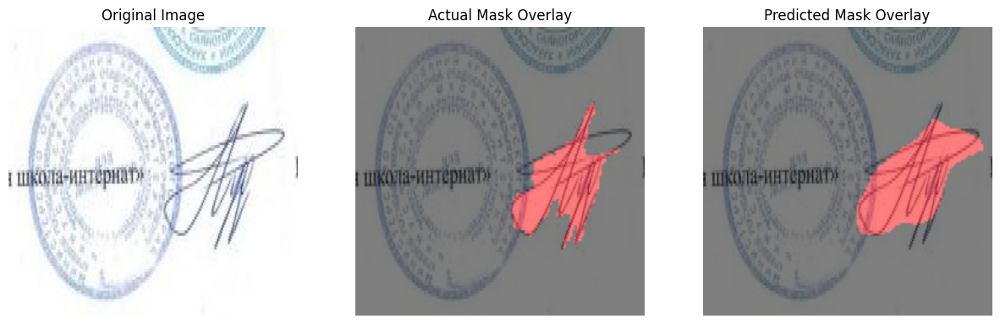

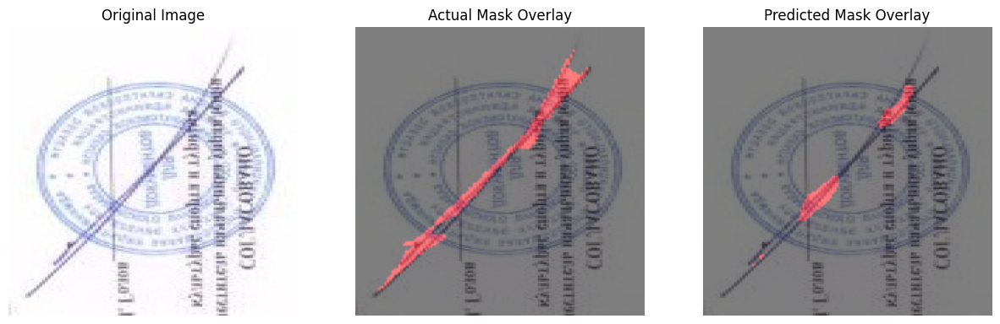

In [23]:
import os
import torch
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image

# Iterate through all images in the test dataset
for test_idx in range(len(test_dataset)):
    # Load test image
    input_image_file = os.path.join(test_dataset.root_dir, test_dataset.images[test_idx])
    input_image = Image.open(input_image_file).convert("RGBA")

    # Get test batch
    test_batch = test_dataset[test_idx]
    images, masks = test_batch["pixel_values"], test_batch["labels"]

    # Add batch dimension
    images = torch.unsqueeze(images, 0)
    masks = torch.unsqueeze(masks, 0)

    # Predict using the model
    with torch.no_grad():  # Disable gradient tracking for inference
        outputs = segformer_finetuner.model(images, masks)
        loss, logits = outputs[0], outputs[1]

    # Upsample logits and get predicted mask
    upsampled_logits = nn.functional.interpolate(
        logits,
        size=masks.shape[-2:],
        mode="bilinear",
        align_corners=False
    )
    predicted_mask = upsampled_logits.argmax(dim=1).cpu().numpy()

    # Convert masks to visualization format
    actual_mask = prediction_to_vis(np.squeeze(masks))
    pred_mask = prediction_to_vis(np.squeeze(predicted_mask))

    # Resize masks to match input image
    actual_mask = actual_mask.resize(input_image.size).convert("RGBA")
    pred_mask = pred_mask.resize(input_image.size).convert("RGBA")

    # Create overlays
    actual_overlay = Image.blend(input_image, actual_mask, alpha=0.5)
    pred_overlay = Image.blend(input_image, pred_mask, alpha=0.5)

    # Display images side by side
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    ax[0].imshow(input_image)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    ax[1].imshow(actual_overlay)
    ax[1].set_title("Actual Mask Overlay")
    ax[1].axis("off")

    ax[2].imshow(pred_overlay)
    ax[2].set_title("Predicted Mask Overlay")
    ax[2].axis("off")

    plt.show()


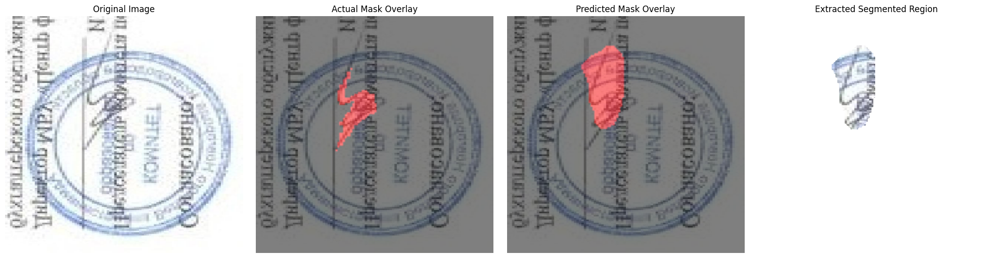

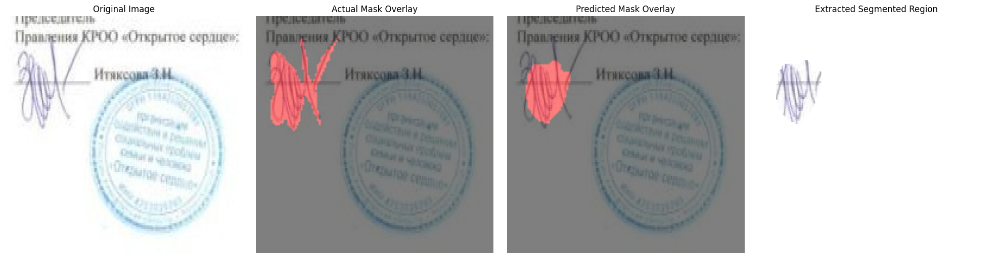

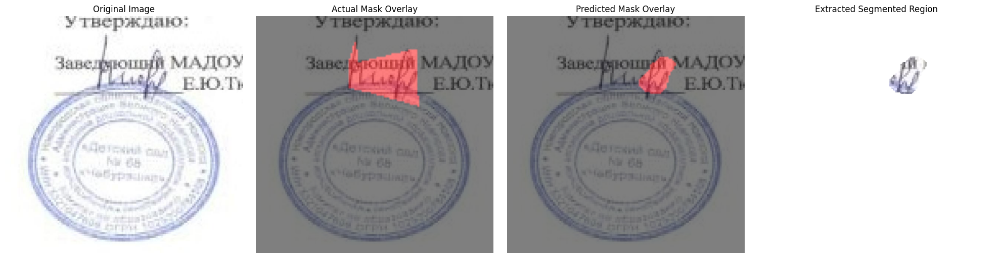

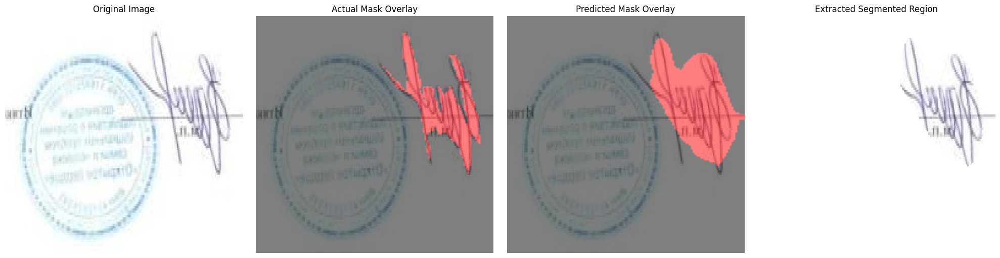

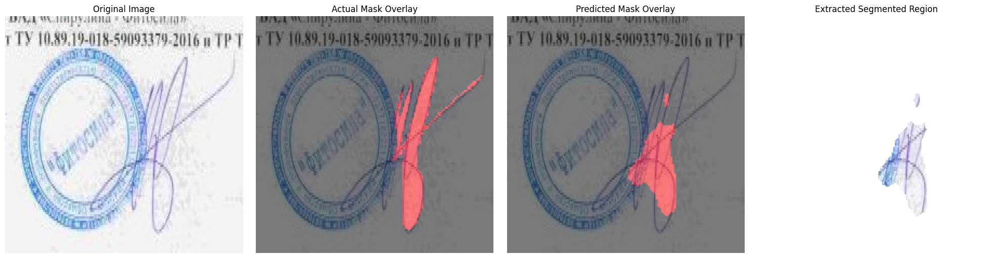

...

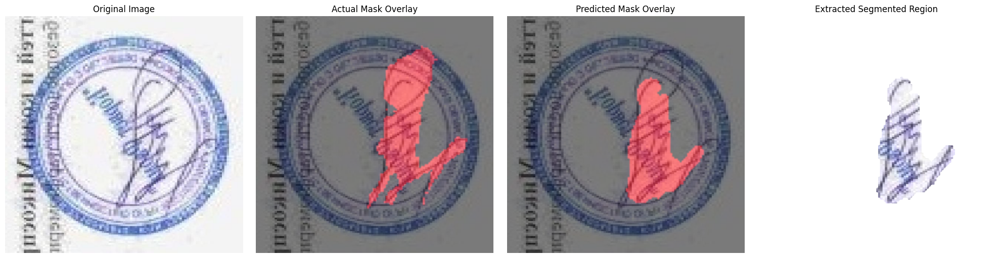

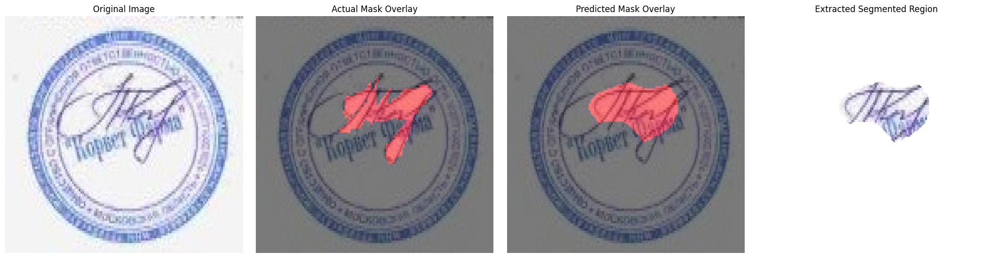

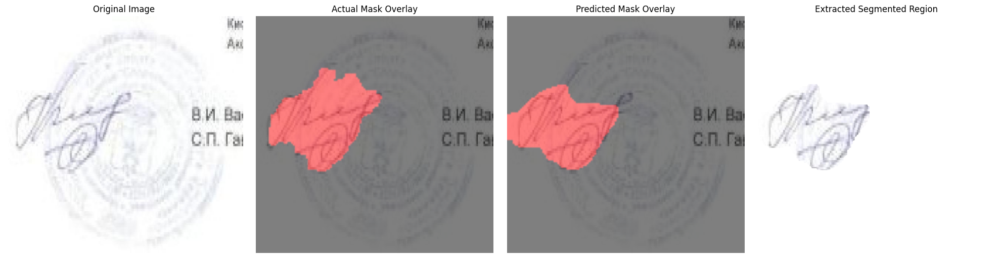

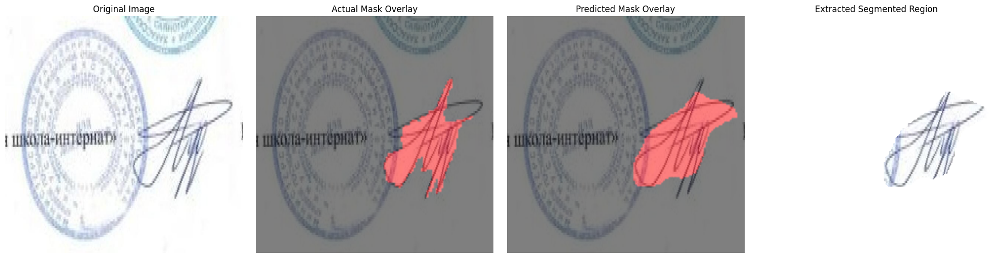

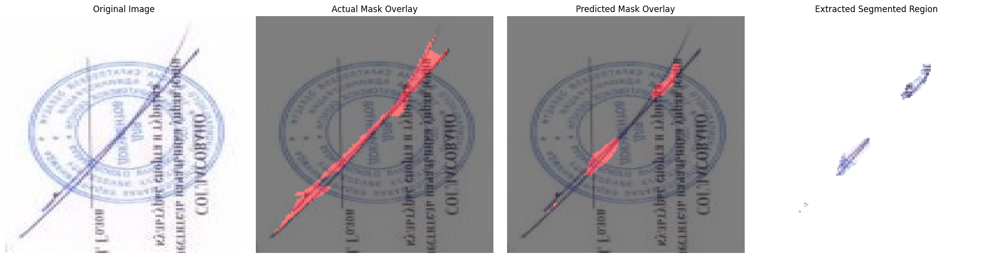

In [36]:
import os
import torch
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image

def extract_segmented_region(image, mask):
    """
    Extract the segmented region from the original image based on the mask.
    
    Args:
        image: PIL Image in RGBA format
        mask: PIL Image with segmentation mask
    
    Returns:
        PIL Image with only the segmented region, rest as transparent
    """
    # Convert to numpy arrays
    img_array = np.array(image)
    mask_array = np.array(mask)
    
    # Create a binary mask (1 where segmented, 0 elsewhere)
    binary_mask = np.any(mask_array[:, :, :3] > 50, axis=2).astype(np.uint8)
    
    # Create output image with transparency
    result = np.zeros_like(img_array)
    result[:, :, :3] = img_array[:, :, :3]  # Copy RGB channels
    
    # Set alpha channel based on the mask
    result[:, :, 3] = binary_mask * 255
    
    # Set pixels outside mask to transparent
    result[:, :, 3] *= (binary_mask > 0)
    
    return Image.fromarray(result)

# Iterate through all images in the test dataset
for test_idx in range(len(test_dataset)):
    # Load test image
    input_image_file = os.path.join(test_dataset.root_dir, test_dataset.images[test_idx])
    input_image = Image.open(input_image_file).convert("RGBA")

    # Get test batch
    test_batch = test_dataset[test_idx]
    images, masks = test_batch["pixel_values"], test_batch["labels"]

    # Add batch dimension
    images = torch.unsqueeze(images, 0)
    masks = torch.unsqueeze(masks, 0)

    # Predict using the model
    with torch.no_grad():  # Disable gradient tracking for inference
        outputs = segformer_finetuner.model(images, masks)
        loss, logits = outputs[0], outputs[1]

    # Upsample logits and get predicted mask
    upsampled_logits = nn.functional.interpolate(
        logits,
        size=masks.shape[-2:],
        mode="bilinear",
        align_corners=False
    )
    predicted_mask = upsampled_logits.argmax(dim=1).cpu().numpy()

    # Convert masks to visualization format
    actual_mask = prediction_to_vis(np.squeeze(masks))
    pred_mask = prediction_to_vis(np.squeeze(predicted_mask))

    # Resize masks to match input image
    actual_mask = actual_mask.resize(input_image.size).convert("RGBA")
    pred_mask = pred_mask.resize(input_image.size).convert("RGBA")

    # Create overlays
    actual_overlay = Image.blend(input_image, actual_mask, alpha=0.5)
    pred_overlay = Image.blend(input_image, pred_mask, alpha=0.5)
    
    # Extract the segmented region based on predicted mask
    segmented_region = extract_segmented_region(input_image, pred_mask)
    
    # Create a white background for better visibility of the segmented region
    white_bg = Image.new("RGBA", input_image.size, (255, 255, 255, 255))
    segmented_with_bg = Image.alpha_composite(white_bg, segmented_region)

    # Display images side by side
    fig, ax = plt.subplots(1, 4, figsize=(20, 5))

    ax[0].imshow(input_image)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    ax[1].imshow(actual_overlay)
    ax[1].set_title("Actual Mask Overlay")
    ax[1].axis("off")

    ax[2].imshow(pred_overlay)
    ax[2].set_title("Predicted Mask Overlay")
    ax[2].axis("off")
    
    ax[3].imshow(segmented_with_bg)
    ax[3].set_title("Extracted Segmented Region")
    ax[3].axis("off")

    plt.tight_layout()
    plt.show()
    
    # Save the segmented region
    output_dir = "segmented_outputs"
    os.makedirs(output_dir, exist_ok=True)
    segmented_region.save(os.path.join(output_dir, f"segmented_{test_idx}.png"))